In [1]:
import os
os.chdir("../../../")

In [2]:
os.environ['CUDA_VISIBLE_DEVICES'] = '2'

In [3]:
import numpy as np
import pandas as pd
import scanpy as sc
import surgeon

Using TensorFlow backend.
/home/mohsen/anaconda3/envs/mohsen/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:526: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/home/mohsen/anaconda3/envs/mohsen/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:527: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/home/mohsen/anaconda3/envs/mohsen/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:528: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/home/mohsen/anacond

In [4]:
sc.set_figure_params(dpi=200)

In [5]:
data_name = "pbmc_atac"
condition_key = "study"
cell_type_key = "cell_type"
target_datasets = ["ATAC-seq", "RNA-seq"]

In [6]:
adata = sc.read(f"./data/{data_name}/{data_name}_normalized_hvg.h5ad")
adata

AnnData object with n_obs × n_vars = 68054 × 2000 
    obs: 'batch', 'cell_type', 'condition', 'domain', 'nCount_RNA', 'nFeature_RNA', 'n_counts', 'orig.ident', 'seurat_annotations', 'stim', 'study'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'

In [7]:
sc.pp.neighbors(adata)
sc.tl.umap(adata)

         Falling back to preprocessing with `sc.pp.pca` and default params.


/home/mohsen/anaconda3/envs/mohsen/lib/python3.7/site-packages/numba/compiler.py:602: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../anaconda3/envs/mohsen/lib/python3.7/site-packages/umap/rp_tree.py", line 135:
@numba.njit(fastmath=True, nogil=True, parallel=True)
def euclidean_random_projection_split(data, indices, rng_state):
^

  self.func_ir.loc))
/home/mohsen/anaconda3/envs/mohsen/lib/python3.7/site-packages/umap/nndescent.py:92: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../anaconda3/envs/mohsen/lib/py

/home/mohsen/anaconda3/envs/mohsen/lib/python3.7/site-packages/matplotlib/font_manager.py:1241: UserWarning: findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
  (prop.get_family(), self.defaultFamily[fontext]))


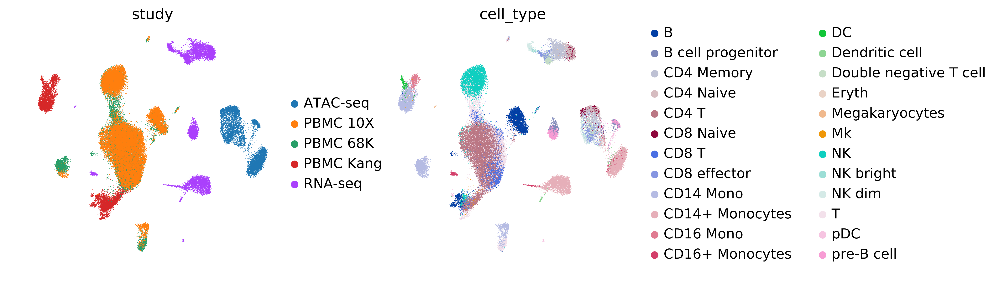

In [8]:
sc.pl.umap(adata, color=[condition_key, cell_type_key], wspace=0.3, frameon=False)

In [9]:
adata.X.min(), adata.X.max()

(0.0, 6.711384)

In [10]:
adata.obs[condition_key].value_counts()

PBMC 10X     26202
PBMC 68K     18006
RNA-seq       9432
ATAC-seq      7866
PBMC Kang     6548
Name: study, dtype: int64

In [11]:
adata.obs.groupby([condition_key, cell_type_key]).size()

study      cell_type             
ATAC-seq   B cell progenitor           252
           CD4 Memory                  914
           CD4 Naive                   641
           CD8 Naive                   414
           CD8 effector                673
           CD14+ Monocytes            3430
           CD16+ Monocytes             222
           Dendritic cell              113
           Double negative T cell      385
           NK bright                    31
           NK dim                      440
           pDC                          56
           pre-B cell                  295
PBMC 10X   B                          2488
           CD4 T                     10706
           CD8 T                      3990
           CD14 Mono                   873
           NK                         6659
           T                          1486
PBMC 68K   B                           896
           CD14 Mono                  1501
           NK                          319
           T        

In [12]:
adata_for_training = adata[~adata.obs[condition_key].isin(target_datasets)]
adata_out_of_sample = adata[adata.obs[condition_key].isin(target_datasets)]

In [13]:
adata_for_training.obs[condition_key].value_counts()

PBMC 10X     26202
PBMC 68K     18006
PBMC Kang     6548
Name: study, dtype: int64

In [14]:
adata_out_of_sample.obs[condition_key].value_counts()

RNA-seq     9432
ATAC-seq    7866
Name: study, dtype: int64

In [15]:
n_datasets = len(adata_for_training.obs[condition_key].unique().tolist())
n_datasets

3

In [16]:
network = surgeon.archs.CVAE(x_dimension=adata_for_training.shape[1],
                             z_dimension=10,
                             architecture=[512, 64, 32],
                             n_conditions=n_datasets,
                             alpha=0.01,
                             beta=100,
                             eta=10,
                             loss_fn='mse',
                             clip_value=10,
                             lambda_l1=0.0,
                             lambda_l2=0.0,
                             output_activation='relu',
                             use_batchnorm=False,
                             dropout_rate=0.05,
                             model_path=f"./models/CVAE/{data_name}/before/",
                             print_summary=False,
                            )

Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.


In [17]:
datasets = adata_for_training.obs[condition_key].unique().tolist()
dataset_encoder = surgeon.utils.create_dictionary(datasets, [])

In [18]:
dataset_encoder

{'PBMC Kang': 0, 'PBMC 68K': 1, 'PBMC 10X': 2}

In [19]:
train_adata, valid_adata = surgeon.utils.train_test_split(adata_for_training, 0.80)

In [20]:
network.train(train_adata,
              valid_adata,
              condition_key=condition_key,
              le=dataset_encoder,
              n_epochs=10000,
              batch_size=1024,
              early_stop_limit=30,
              lr_reducer=20,
              n_per_epoch=0,
              save=True,
              retrain=False,
              verbose=50)

Model has been successfully restored!


In [21]:
encoder_datasets, _ = surgeon.utils.label_encoder(adata_for_training, label_encoder=network.condition_encoder,
                                                        condition_key=condition_key)

In [20]:
latent_adata = network.to_mmd_layer(adata_for_training, encoder_datasets, encoder_datasets)
latent_adata

AnnData object with n_obs × n_vars = 50756 × 32 
    obs: 'batch', 'cell_type', 'condition', 'domain', 'nCount_RNA', 'nFeature_RNA', 'n_counts', 'orig.ident', 'seurat_annotations', 'stim', 'study'

In [21]:
sc.settings.set_figure_params(dpi=200)

In [22]:
sc.pp.neighbors(latent_adata)
sc.tl.umap(latent_adata)

/home/mohsen/anaconda3/envs/mohsen/lib/python3.7/site-packages/numba/compiler.py:602: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../anaconda3/envs/mohsen/lib/python3.7/site-packages/umap/rp_tree.py", line 135:
@numba.njit(fastmath=True, nogil=True, parallel=True)
def euclidean_random_projection_split(data, indices, rng_state):
^

  self.func_ir.loc))
/home/mohsen/anaconda3/envs/mohsen/lib/python3.7/site-packages/umap/nndescent.py:92: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../anaconda3/envs/mohsen/lib/py

/home/mohsen/anaconda3/envs/mohsen/lib/python3.7/site-packages/matplotlib/font_manager.py:1241: UserWarning: findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
  (prop.get_family(), self.defaultFamily[fontext]))


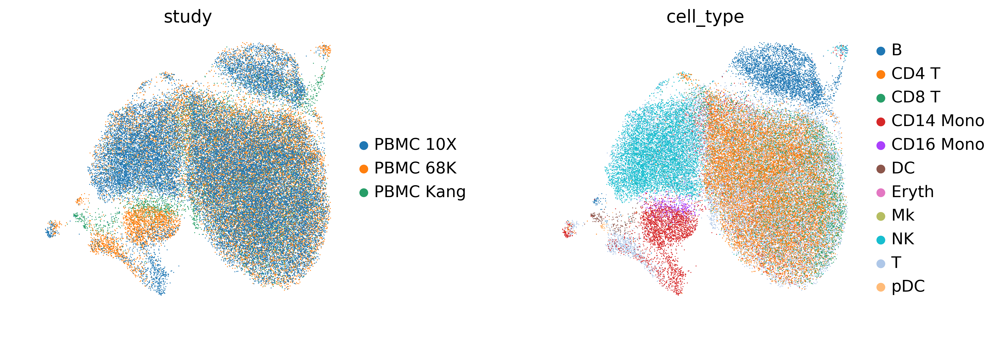

In [23]:
sc.pl.umap(latent_adata, color=[condition_key, cell_type_key], 
           wspace=0.5, frameon=False, save=None)

In [22]:
new_network = surgeon.operate(network,
                              new_conditions=target_datasets,
                              freeze=True,
                              freeze_expression_input=False,
                              remove_dropout=False,
                              new_training_kwargs={"beta": 100,
                                                   "eta":10.0,},
                              )

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
data (InputLayer)               (None, 2000)         0                                            
__________________________________________________________________________________________________
encoder_labels (InputLayer)     (None, 5)            0                                            
__________________________________________________________________________________________________
first_layer (FirstLayer)        (None, 512)          1026560     data[0][0]                       
                                                                 encoder_labels[0][0]             
__________________________________________________________________________________________________
leaky_re_lu_7 (LeakyReLU)       (None, 512)          0           first_layer[0][0]                
__________

In [23]:
new_network.model_path = f"./models/CVAE/{data_name}/after/"

In [24]:
new_network.condition_encoder

{'PBMC Kang': 0, 'PBMC 68K': 1, 'PBMC 10X': 2, 'ATAC-seq': 3, 'RNA-seq': 4}

In [25]:
adata_out_of_sample.obs[condition_key].value_counts()

RNA-seq     9432
ATAC-seq    7866
Name: study, dtype: int64

In [26]:
train_adata, valid_adata = surgeon.utils.train_test_split(adata_out_of_sample, 0.80)

In [27]:
train_adata.shape, valid_adata.shape

((13838, 2000), (3460, 2000))

In [28]:
new_network.train(train_adata,
                  valid_adata,
                  condition_key=condition_key,
                  le=new_network.condition_encoder,
                  n_epochs=1000,
                  batch_size=1024,
                  early_stop_limit=30,
                  lr_reducer=20,
                  n_per_epoch=0,
                  save=True,
                  retrain=True,
                  verbose=50)

Instructions for updating:
Use tf.cast instead.


In [29]:
new_network.condition_encoder

{'PBMC Kang': 0, 'PBMC 68K': 1, 'PBMC 10X': 2, 'ATAC-seq': 3, 'RNA-seq': 4}

In [30]:
encoder_datasets, _ = surgeon.utils.label_encoder(adata_out_of_sample, label_encoder=new_network.condition_encoder,
                                                        condition_key=condition_key)
encoder_datasets.shape

(17298, 1)

In [31]:
latent_adata = new_network.to_mmd_layer(adata_out_of_sample, encoder_datasets, encoder_datasets)
latent_adata

AnnData object with n_obs × n_vars = 17298 × 32 
    obs: 'batch', 'cell_type', 'condition', 'domain', 'nCount_RNA', 'nFeature_RNA', 'n_counts', 'orig.ident', 'seurat_annotations', 'stim', 'study'

In [32]:
sc.pp.neighbors(latent_adata)
sc.tl.umap(latent_adata)

/home/mohsen/anaconda3/envs/mohsen/lib/python3.7/site-packages/numba/compiler.py:602: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../anaconda3/envs/mohsen/lib/python3.7/site-packages/umap/rp_tree.py", line 135:
@numba.njit(fastmath=True, nogil=True, parallel=True)
def euclidean_random_projection_split(data, indices, rng_state):
^

  self.func_ir.loc))
/home/mohsen/anaconda3/envs/mohsen/lib/python3.7/site-packages/numba/compiler.py:602: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../anaconda3/envs/mohsen/lib/p

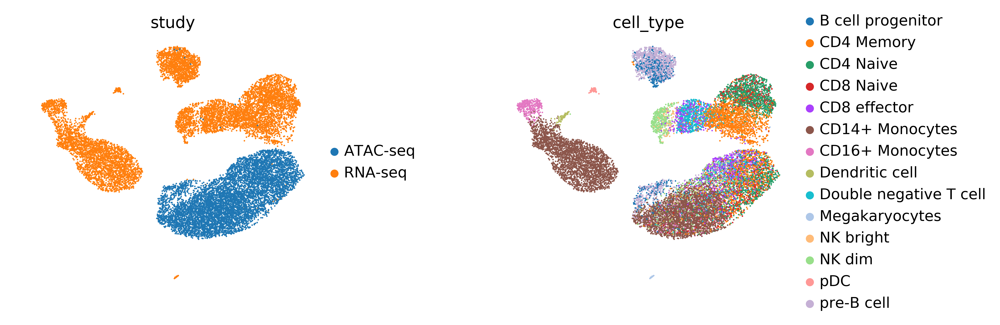

In [33]:
sc.pl.umap(latent_adata, color=[condition_key, cell_type_key], 
           wspace=0.5, frameon=False, save=None)

In [34]:
encoder_datasets, _ = surgeon.utils.label_encoder(adata, label_encoder=new_network.condition_encoder,
                                                        condition_key=condition_key)
encoder_datasets.shape

(68054, 1)

In [35]:
latent_adata = new_network.to_mmd_layer(adata, encoder_datasets, encoder_datasets)

In [36]:
sc.pp.neighbors(latent_adata)
sc.tl.umap(latent_adata)

/home/mohsen/anaconda3/envs/mohsen/lib/python3.7/site-packages/numba/compiler.py:602: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../anaconda3/envs/mohsen/lib/python3.7/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  self.func_ir.loc))


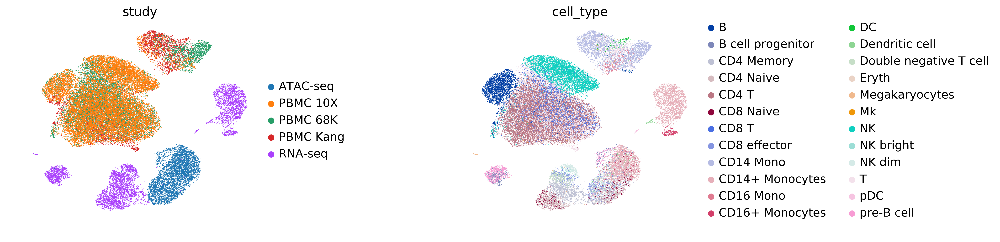

In [37]:
sc.pl.umap(latent_adata, color=[condition_key, cell_type_key], 
           wspace=0.7, frameon=False, save=None)